In [1]:
import pandas as pd
from scipy.stats import kendalltau, pearsonr, spearmanr
import itertools
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# Analysis of All Catchments So Far

- currently provided with 466 catchment-worth of data, 24% less than 618 reported in Nienke's sample
- cross correlation 
['ndvi', 'evi', 'nbr', 'ndmi', 'gndvi', 'ndbi', 'BRIGHTNESS','GREENNESS', 'WETNESS']
                                                    VS
['AI', 'EI', 'SI', 'ST', 'T', 'is_dur', 'omega']

and their respective pairs to find the highest corresponding pairs

In [2]:
abs_path = 'C:/users/creeb/ThesisGit/Thesis_Git_MOH'

meuse = pd.read_excel(f'{abs_path}/meuse/meuse_all_decadal_indices_combined_1.xlsx')#, index_col='system_index')
meuse_delta = pd.read_excel(f'{abs_path}/meuse/meuse_all_decadal_delta_1.xlsx')#, index_col='system_index')

#ThesisGit/Thesis_Git_MOH/meuse/meuse_all_decadal_indices_combined_1.xlsx

GB = pd.read_excel(f'{abs_path}/camels_GB/camels_GB_all_decadal_indices_combined_1.xlsx')#, index_col='system_index')
GB_delta = pd.read_excel(f'{abs_path}/camels_GB/camels_GB_all_decadal_delta_1.xlsx')#, index_col='system_index')


USA = pd.read_excel(f'{abs_path}/camels_USA/camels_USA_all_decadal_indices_combined_1.xlsx')#, index_col='system_index')
USA_delta = pd.read_excel(f'{abs_path}/camels_USA/camels_USA_all_decadal_delta_1.xlsx')#, index_col='system_index')

SR_indices = meuse.keys()[14:23]
SR_delta_indices = meuse_delta.keys()[14:23]
SR_exclude = meuse.keys()[0:23]
SR_delta_exclude =  meuse_delta.keys()[0:23]
GB


,Unnamed: 0,system_index,country_code,catchment_name,decade_ending,LT_AI,LT_EI,LT_SR,B1,B2,...,is_dur,omega,dp,sp,dt,st,sd,de,se,Sr actual
0,0,000000000000000000c6,GB,31023,1999,0.832453,0.757562,276.109928,554.824370,823.114089,...,4.378709,4.302864,0.190508,0.609697,6.398308,0.310383,0.299314,0.941897,0.238733,355.945833
1,1,00000000000000000084,GB,27051,1999,0.617836,0.508876,174.590127,584.123481,904.080146,...,3.877133,2.678121,0.270866,0.684427,6.013172,0.310766,0.373661,0.949198,0.235746,218.068203
2,2,000000000000000001df,GB,55008,1999,0.212182,0.180242,93.997790,623.878046,846.779378,...,3.196498,1.924136,0.400478,0.727648,5.564533,0.318734,0.408914,0.910475,0.239090,70.344494
3,3,00000000000000000082,GB,27047,1999,0.259286,0.140039,49.283609,570.353249,800.212860,...,3.226691,1.393414,0.432828,0.718271,5.924309,0.310691,0.407581,0.989664,0.235601,49.274471
4,4,0000000000000000021b,GB,67010,1999,0.242187,0.177813,80.284097,636.915087,861.069729,...,3.271863,1.486803,0.476439,0.740320,5.574993,0.316643,0.423677,0.936919,0.238081,55.860515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,185,0000000000000000025a,GB,79002,2009,0.309349,0.263076,112.961888,643.551528,877.908353,...,3.137112,2.175530,0.354906,0.658093,5.519755,0.322293,0.335800,0.951026,0.226497,90.610722
186,186,00000000000000000207,GB,62001,2009,0.396999,0.272732,105.037037,521.552653,804.113788,...,3.181982,1.542914,0.416709,0.650262,5.318979,0.330350,0.319912,0.891309,0.227479,72.280908
187,187,000000000000000001c0,GB,54008,2009,0.630884,0.528647,191.328116,640.524403,912.649778,...,3.766031,2.609451,0.180864,0.625262,5.872995,0.322216,0.303046,0.891617,0.230289,160.994650
188,188,00000000000000000235,GB,71001,2009,0.376212,0.328048,124.437664,556.336791,822.130505,...,3.244565,2.075554,0.310374,0.617871,6.046760,0.319376,0.298495,0.923730,0.230696,95.372714


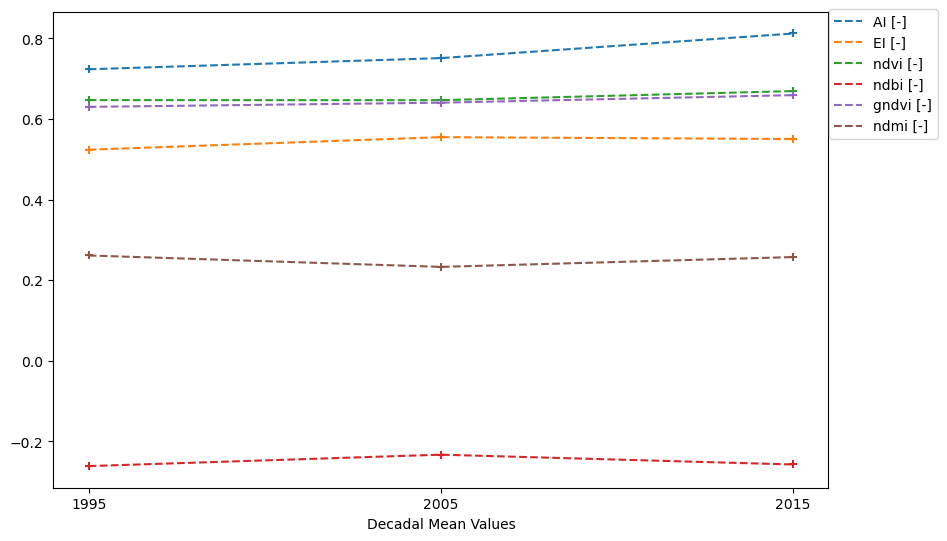

In [3]:
meuse_grouped = meuse.groupby('system_index')

label = ['AI', 'EI', 'ndvi', 'ndbi', 'gndvi', 'ndmi']


plt.figure(figsize=(10, 6.18))

for i, (group, data) in enumerate(meuse_grouped):
    if group == '00000000000000000027':
        for j in label:
            plt.plot(data.decade_ending, data.loc[:, j], ls='--', label=f'{j} [-]')
            plt.scatter(data.decade_ending, data.loc[:, j], marker='+')
            plt.xticks(data.decade_ending)
            plt.xlabel(f'Decadal Mean Values')
            plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1.02))
        #display(data)

In [4]:
def key_intersection(df1, df2, df3):
    k1 , k2, k3 = set(df1.keys().values), set(df2.keys().values), set(df3.keys().values)
    intersection = k1.intersection(k2).intersection(k3)
    return intersection

def kendall_pval(x,y):
    return kendalltau(x,y)[1]

def pearsonr_pval(x,y):
    return pearsonr(x,y)[1]

def spearmanr_pval(x,y):
    return spearmanr(x,y)[1]


In [5]:
keys = key_intersection(meuse, GB, USA)#.symmetric_difference(SR_indices)
d_keys = key_intersection(meuse_delta, GB_delta, USA_delta)#.symmetric_difference(SR_delta_indices)

WB_keys = {'LT_AI', 'LT_EI', 'LT_SR', 'AI', 'EI', 'SI', 'ST', 'T', 'is_dur', 'omega'}


In [6]:
def create_combined_table(df1, df2, df3, keys):
    combo = pd.DataFrame()
    for key in keys:
        a = df1.loc[:, key]
        b = df2.loc[:, key]
        c = df3.loc[:, key]
        
        combo_col = list(itertools.chain(*(a.to_list(),
                                                 b.to_list(),
                                                c.to_list(),))) 
        
        combo[key] = combo_col
    
    prs_r = combo.corr()
    
    p = combo.corr(method=pearsonr_pval)
    
    return [combo, prs_r, p]
        

In [7]:
combo, prs_r, p = create_combined_table(meuse, GB, USA, keys)
d_combo, d_r, d_p = create_combined_table(meuse_delta, GB_delta, USA_delta, d_keys)

In [8]:
def sorted_p(p):
    p.replace(1, np.nan)
    sorted_p = pd.DataFrame()

    for i in p.keys()[:]:
        sort = pd.DataFrame(p.loc[:, i].sort_values(ascending=False))
        sorted_p[f'{i}_vs'] = sort.index
        sorted_p[f'{i}_p'] = sort.values
    return sorted_p

In [9]:
sort_p = sorted_p(p)
sort_dp = sorted_p(d_p)

In [10]:
def plot_descending_P(SR_index:[], df_all, sorted_p, prs_r, exclude, delta=False, plot=False, savefig=False, color_by=str, levels=[]):
    '''
    The function loops through the list of Surface Reflectance indices passed. The plotting returns scatters in descending
    order from   to:  1 > p-value > 0.01 
    '''
    ls = []
    
    for i in SR_index:
        
        if delta==True:
            i = f'd_{i}'

        high_to_low_id = sorted_p.loc[:, f'{i}_vs']
        high_to_low_p = sorted_p.loc[:, f'{i}_p']
        
        for j in zip(high_to_low_id, high_to_low_p):
            if j[1] < 0.1 and j[0] not in exclude:
                
                
                r = prs_r.loc[i, j[0]]
                ls.append((i, j[0], j[1], r))
                
                
                if plot == True:
                    plt.figure(figsize=(10, 6.18))
                    
                    
                    
                    x = df_all.loc[:, i] 

                    y = df_all.loc[:, j[0]]


                    plt.suptitle(f'$p$: {j[1]:.3e}, $r$= {r:.3e}, $n$ = {len(x)}')
        
                    plt.xlabel(i)

                    plt.ylabel(j[0])
                
                
                if delta==True and plot == True:
                    
                    plt.title(f'$\Delta$ {i[2:]}  vs $\Delta$ {j[0][2:]}')
                    
                    plt.scatter(x, y, c=df_all.loc[:,  color_by], alpha=0.6)
    
                    plt.colorbar(ticks=levels, label=color_by)
                    
                    plt.xlabel(f'$\Delta${i[2:]}')

                    plt.ylabel(f'$\Delta${j[0][2:]}')
        
                    if savefig == True:
                
                        plt.savefig(f'outputs/SR_delta_correlations/{i}_{j[0]}_{color_by}')

                elif delta==False and plot == True:    
                    

                    plt.title(f'{i} vs  {j[0]}')
                    
                    plt.scatter(x, y, c=df_all.loc[:,  color_by], alpha=0.6)
                    
                    plt.colorbar(ticks=levels, label=color_by)
                    
                    if savefig == True:
                        plt.savefig(f'outputs/SR_correlations/{i}_{j[0]}_{color_by}')
                
                ##if j[1] <= 0.1:
                    #break
                
            else:
                None
        
    return ls

C:\Users\creeb\AppData\Local\Temp\ipykernel_42804\2460716832.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 6.18))


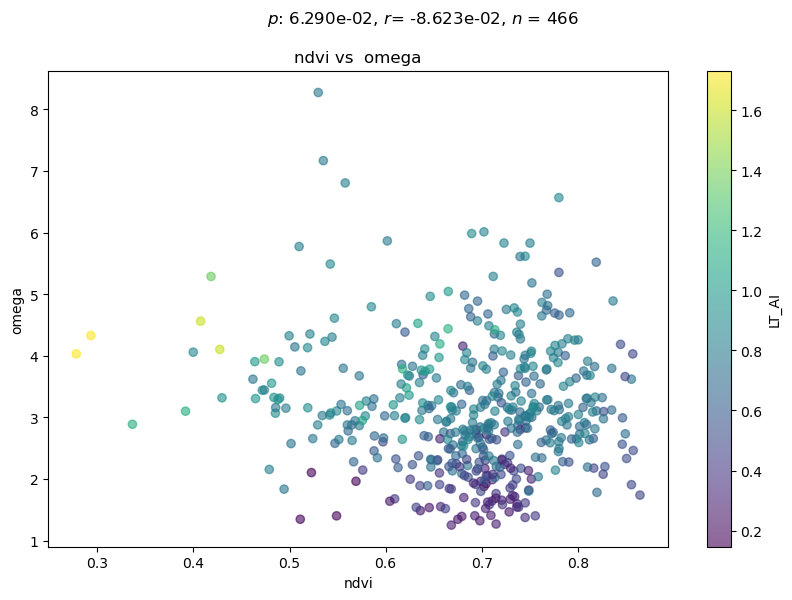

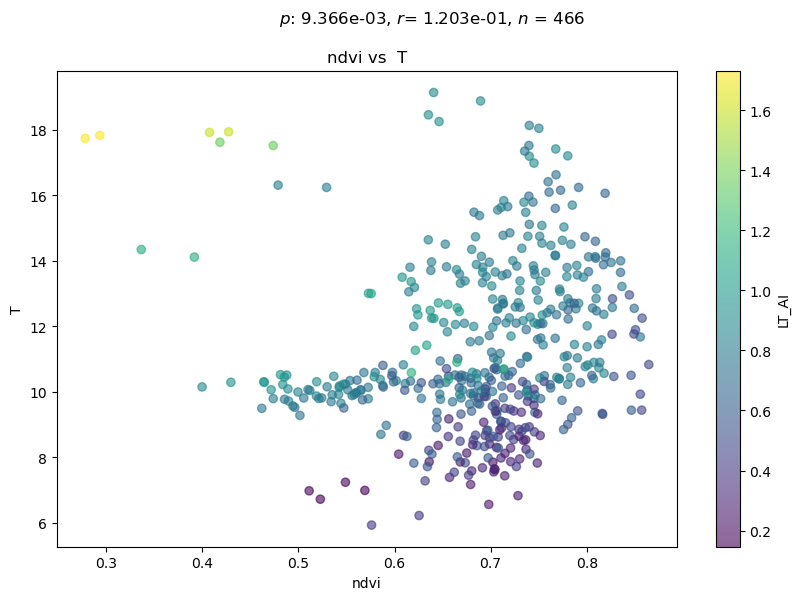

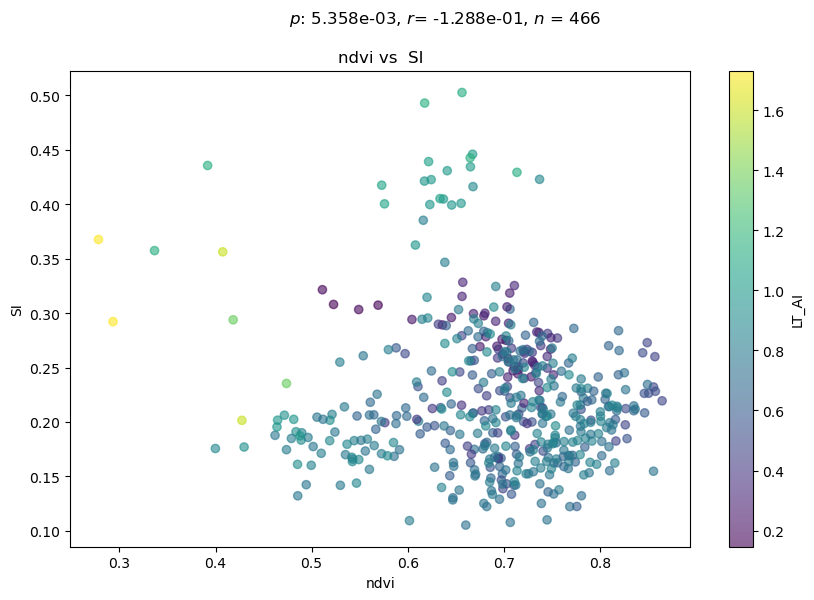

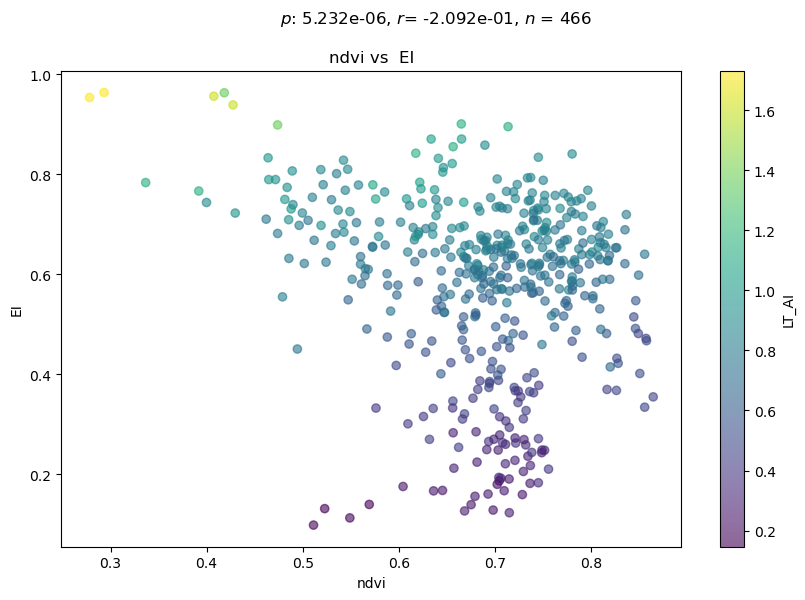

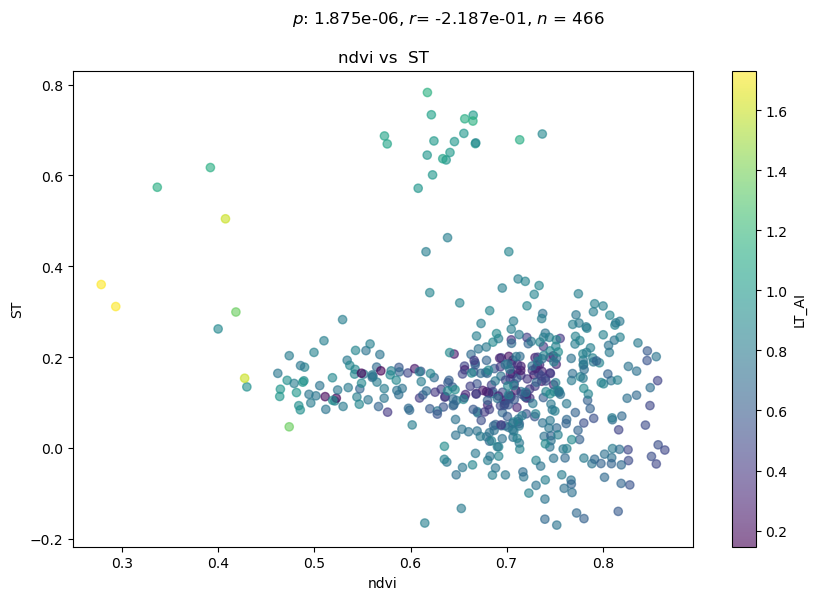

...

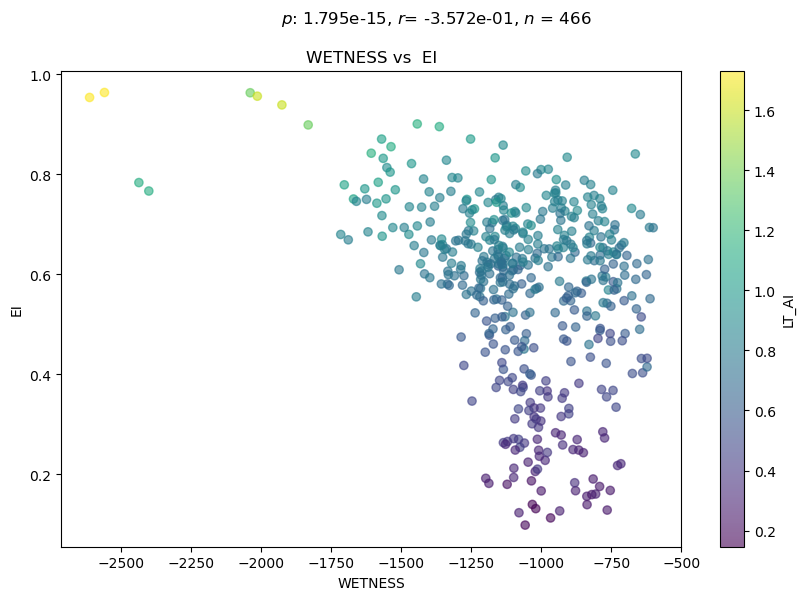

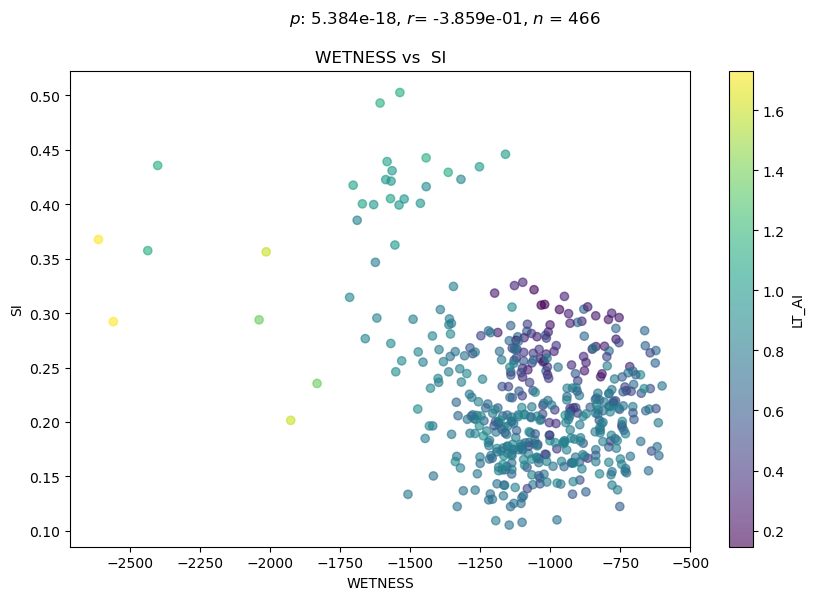

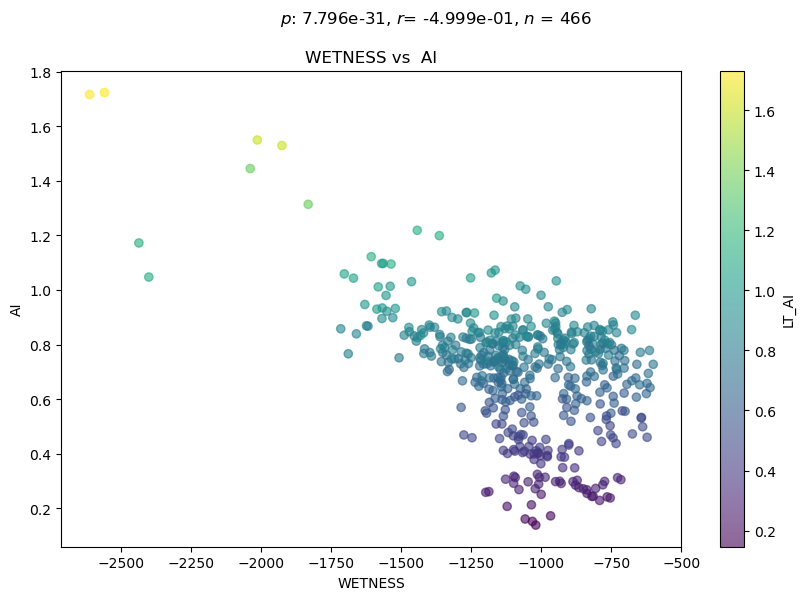

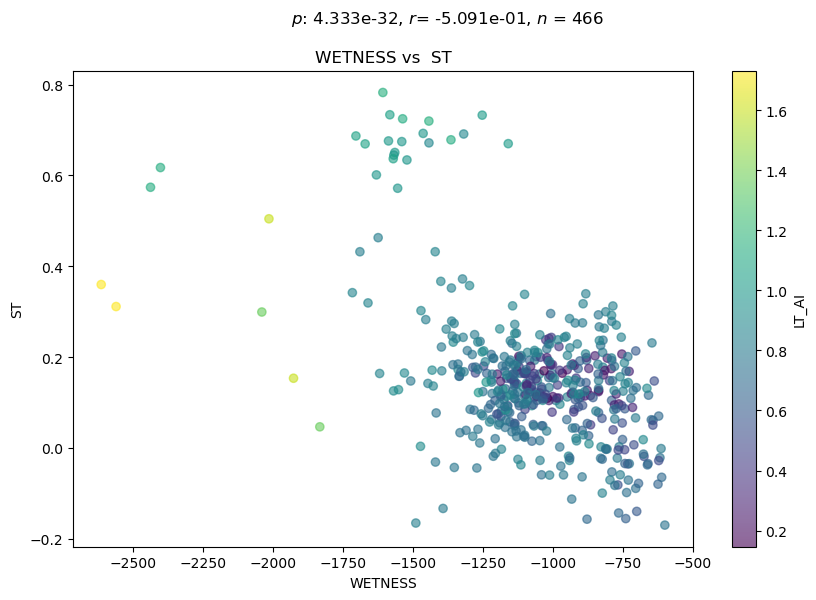

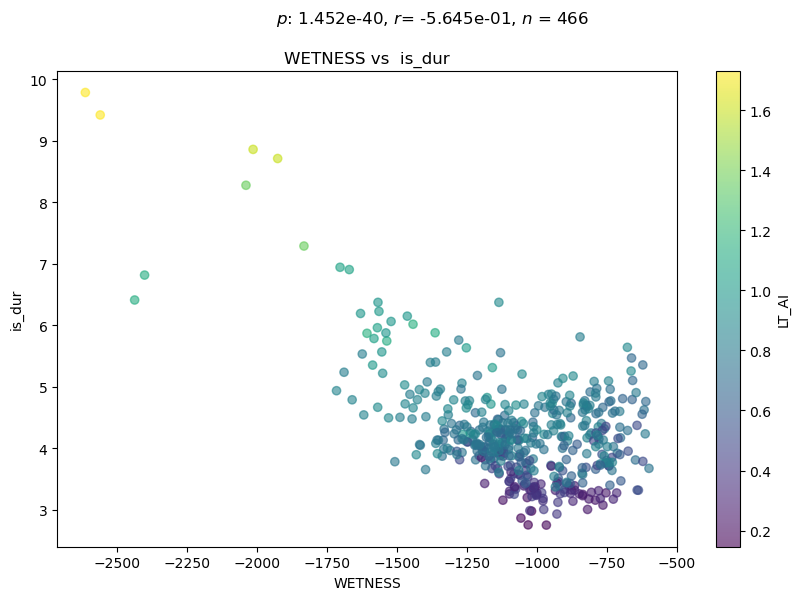

In [11]:
#SR_indices
years_levels = [1989, 1999, 2009, 2015]
AI_levels = [0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2]
AI_levels_used = [0.2, 0.4, 0.6, 0.8, 1, 1.2]

 
#ranking = plot_descending_P(SR_indices, combo, sort_p, prs_r, SR_exclude, delta=False, plot=True, savefig=False, color_by='decade_ending', levels = years_levels)
ranking = plot_descending_P(SR_indices, combo, sort_p, prs_r, SR_exclude, delta=False, plot=True, savefig=True, color_by='LT_AI', levels = AI_levels)

#sort_p.keys()

In [12]:
df_ranking = pd.DataFrame(ranking, columns= ['SR_ind', 'WB_Clim_ind', 'prs_P', 'prs_R']).sort_values('prs_P')
df_ranking.to_excel(f'outputs/SR_correlations/ranking_correlatons.xlsx')
df_ranking

,SR_ind,WB_Clim_ind,prs_P,prs_R
36,ndbi,is_dur,1.216660e-43,0.582255
23,ndmi,is_dur,1.216660e-43,-0.582255
55,WETNESS,is_dur,1.451799e-40,-0.564460
35,ndbi,AI,8.293767e-35,0.527972
22,ndmi,AI,8.293767e-35,-0.527972
16,nbr,is_dur,1.269822e-32,-0.512868
54,WETNESS,ST,4.333393e-32,-0.509065
15,nbr,AI,1.263753e-31,-0.505710
53,WETNESS,AI,7.796047e-31,-0.499919
34,ndbi,ST,4.870574e-27,0.470450


C:\Users\creeb\AppData\Local\Temp\ipykernel_42804\2460716832.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 6.18))


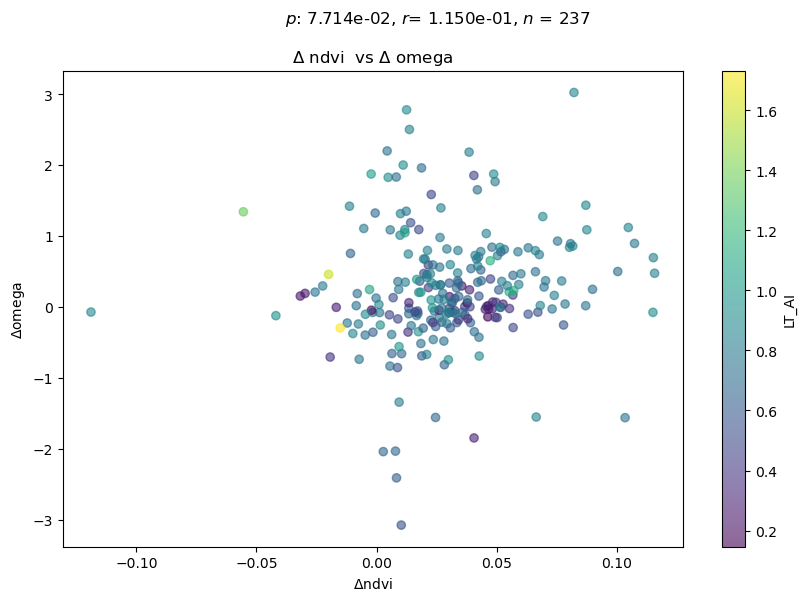

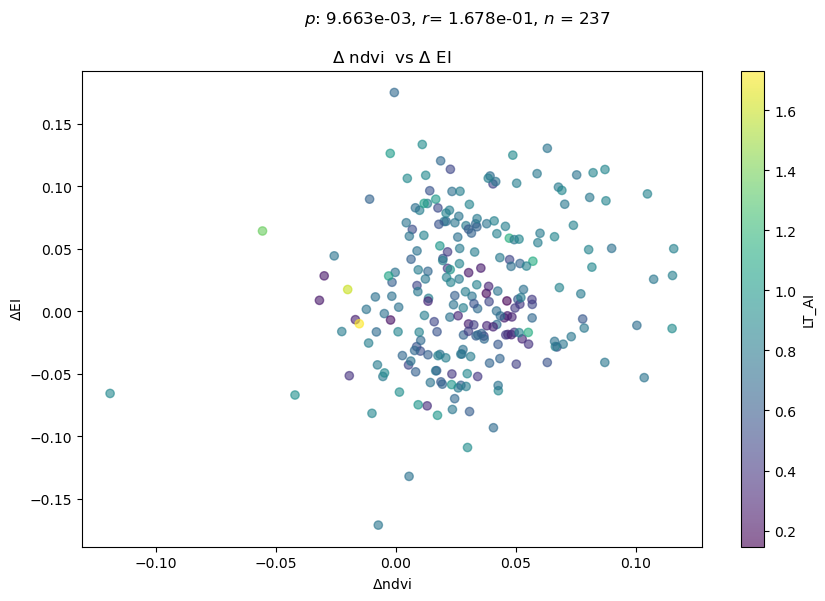

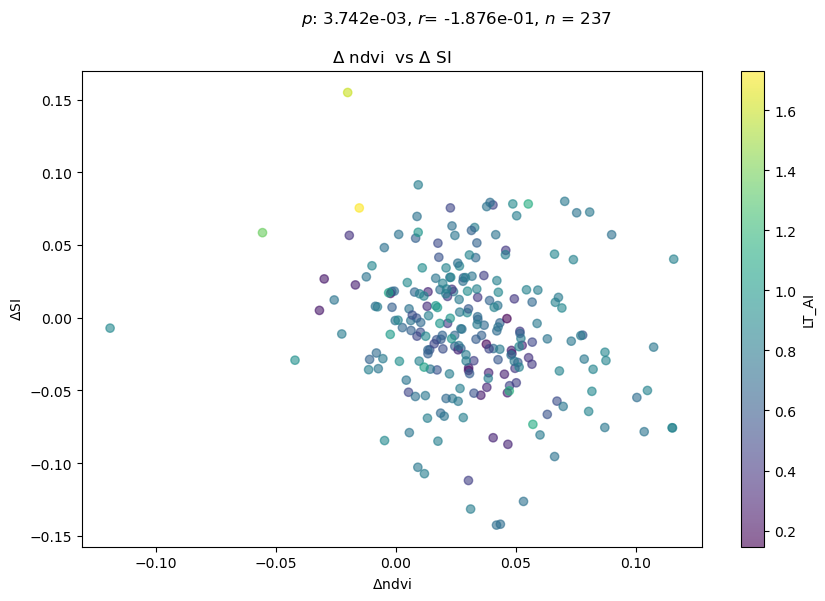

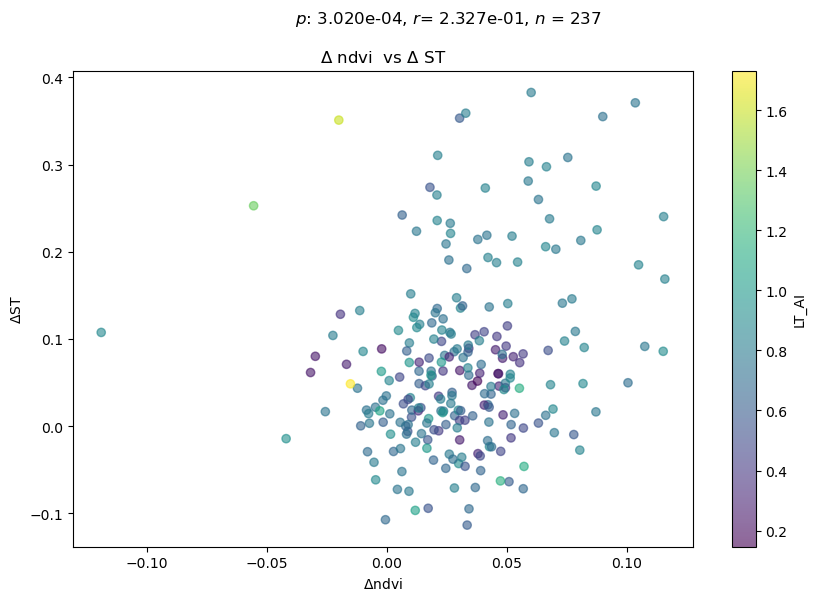

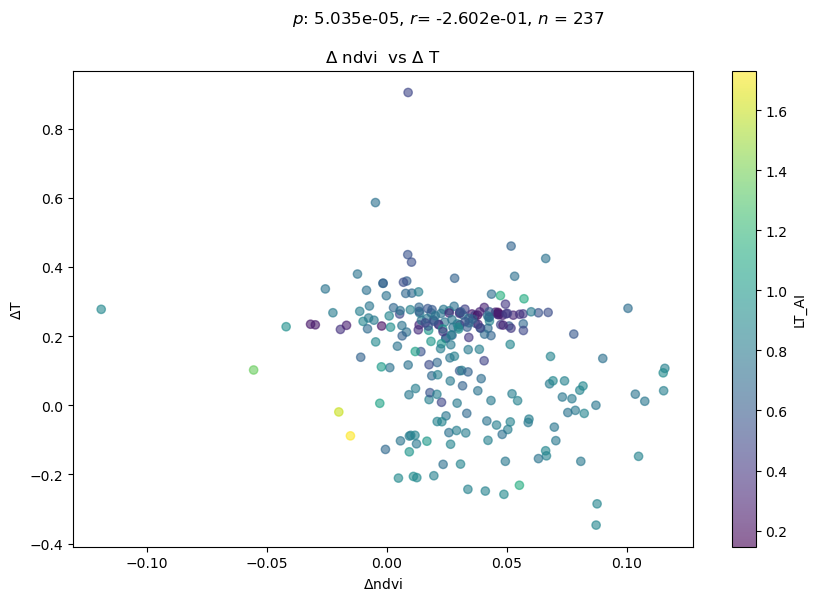

...

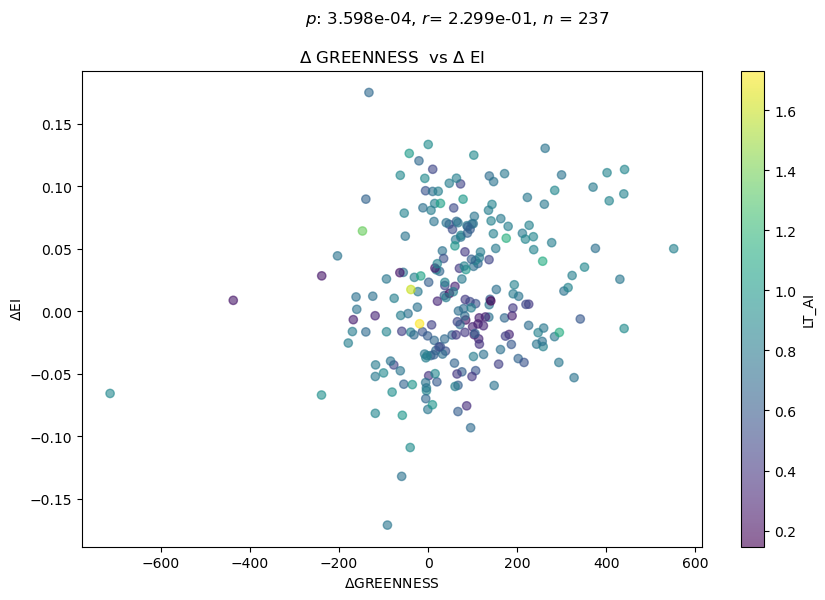

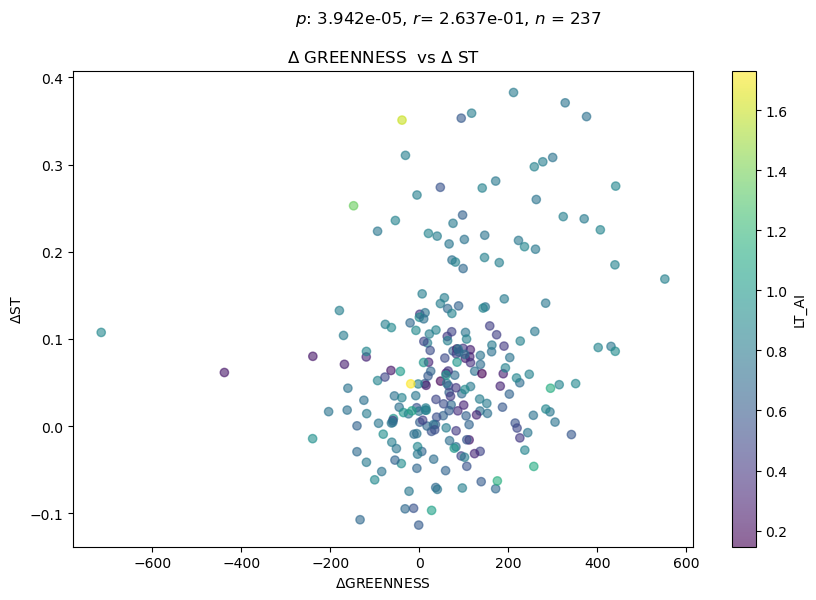

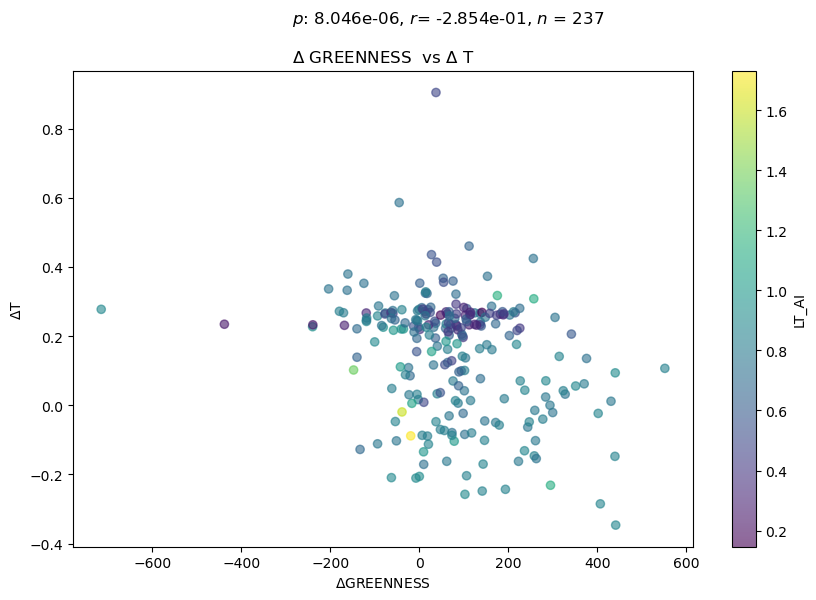

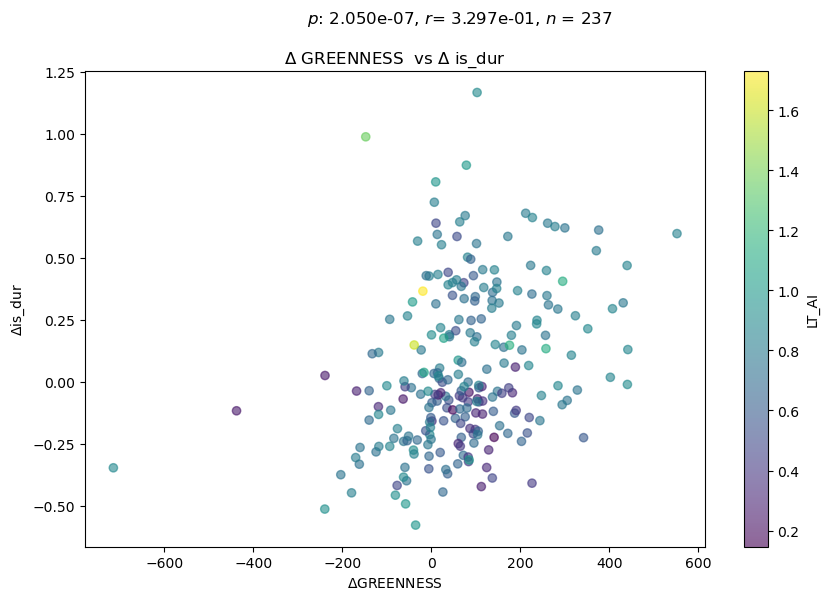

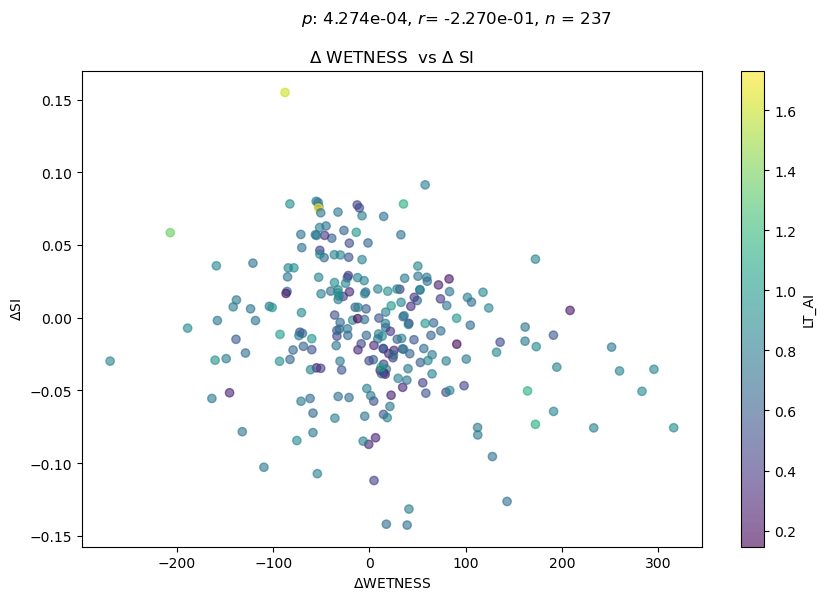

In [13]:
delta_years_levels = [1995, 1999, 2009, 2015]

delta_ranking = plot_descending_P(SR_indices, d_combo, sort_dp, d_r, SR_delta_exclude, delta=True, plot=True, savefig=True, color_by='LT_AI', levels = AI_levels)

In [14]:
df_ranked_delta = pd.DataFrame(delta_ranking, columns= ['SR_ind', 'WB_Clim_ind', 'prs_P', 'prs_R']).sort_values('prs_P')
df_ranked_delta.to_excel(f'outputs/SR_delta_correlations/ranking_delta_correlatons.xlsx')
df_ranked_delta

,SR_ind,WB_Clim_ind,prs_P,prs_R
20,d_gndvi,d_T,3.424052e-08,-0.348962
19,d_gndvi,d_is_dur,1.348645e-07,0.334323
33,d_GREENNESS,d_is_dur,2.050014e-07,0.329696
18,d_gndvi,d_ST,1.302789e-06,0.308288
28,d_BRIGHTNESS,d_T,6.161913e-06,0.288896
32,d_GREENNESS,d_T,8.046405e-06,-0.285419
31,d_GREENNESS,d_ST,3.941898e-05,0.263682
5,d_ndvi,d_is_dur,4.572550e-05,0.261554
4,d_ndvi,d_T,5.035324e-05,-0.260161
3,d_ndvi,d_ST,3.019763e-04,0.232728


# Grouping Delta Table by Aridity

 - first gather the aridity classes per index
 - Adapt the function of plotting the aridity classes as defined by nienke

In [15]:
combo

,catchment_name,B4,decade_ending,AI,EI,B7,ndbi,LT_EI,T,SI,...,ndmi,GREENNESS,WETNESS,Unnamed: 0,system_index,nbr,is_dur,LT_SR,B3,country_code
0,La Meuse Stenay,3505.870580,1995,0.723527,0.523830,1080.063217,-0.261393,0.491502,9.929822,0.130338,...,0.261393,1947.346107,-1101.055802,0,00000000000000000027,0.535894,4.209709,136.127009,760.450265,FR
1,La Vence la Francheville,3854.445260,1995,0.538129,0.409847,1059.051313,-0.279797,0.454026,9.312353,0.222241,...,0.279797,2283.432161,-1135.365148,1,0000000000000000001c,0.570896,4.320080,185.448285,669.720762,FR
2,La Bar Cheveuges,3689.468405,1995,0.600242,0.580658,1021.925823,-0.281666,0.584906,9.625349,0.190065,...,0.281666,2146.471886,-1070.187065,2,00000000000000000023,0.571166,4.293069,267.844657,689.500991,FR
3,Le Loison Han-lÃ©s-Juvigny,3548.118212,1995,0.638256,0.617702,1013.352084,-0.273264,0.606348,9.875898,0.181241,...,0.273264,2059.632583,-1075.027378,3,00000000000000000026,0.561081,4.365462,259.431829,670.659755,FR
4,La Meuse Saint-Mihiel,3645.584904,1995,0.745344,0.515176,1068.602832,-0.266628,0.537656,9.950750,0.125189,...,0.266628,2109.174757,-1129.484224,4,00000000000000000028,0.549572,4.304854,161.677726,698.729876,FR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461,3498500,3720.422102,2009,0.652670,0.610182,758.044025,-0.365442,0.590612,12.701172,0.218926,...,0.365442,2361.124447,-773.772549,229,000000000000000000f8,0.666455,3.723684,234.503356,469.320062,USA
462,6814000,3064.483575,2009,1.097098,0.870416,1299.125956,-0.120528,0.818152,11.421583,0.405217,...,0.120528,1637.531815,-1570.136446,230,00000000000000000179,0.404926,5.957845,311.800764,682.384961,USA
463,6921070,3447.254681,2009,0.836939,0.753206,1127.520982,-0.199551,0.688914,13.515433,0.246029,...,0.199551,2010.817466,-1362.424560,231,0000000000000000018b,0.506990,5.399113,267.042743,617.005689,USA
464,8086290,2617.010094,2009,1.549649,0.956205,1768.761404,0.031569,0.947938,17.914717,0.356316,...,-0.031569,899.262092,-2013.851057,232,000000000000000001c5,0.199563,8.856678,459.384967,1112.382887,USA


In [16]:
labels=[f'{int(AI_levels[0])}-{int(AI_levels[1])}',
         f'{int(AI_levels[1])}-{int(AI_levels[2])}',
         f'{int(AI_levels[2])}-{int(AI_levels[3])}',
         f'{int(AI_levels[3])}-{int(AI_levels[4])}',
         f'{int(AI_levels[4])}-{int(AI_levels[5])}',
         f'{int(AI_levels[5])}-{int(AI_levels[6])}',
         f'{int(AI_levels[6])}-{int(AI_levels[7])}',
         f'{int(AI_levels[7])}-{int(AI_levels[8])}',
         f'{int(AI_levels[8])}-{int(AI_levels[9])}',]
print(labels)

['0-0', '0-0', '0-0', '0-1', '1-1', '1-1', '1-1', '1-1', '1-2']


In [17]:
combo

,catchment_name,B4,decade_ending,AI,EI,B7,ndbi,LT_EI,T,SI,...,ndmi,GREENNESS,WETNESS,Unnamed: 0,system_index,nbr,is_dur,LT_SR,B3,country_code
0,La Meuse Stenay,3505.870580,1995,0.723527,0.523830,1080.063217,-0.261393,0.491502,9.929822,0.130338,...,0.261393,1947.346107,-1101.055802,0,00000000000000000027,0.535894,4.209709,136.127009,760.450265,FR
1,La Vence la Francheville,3854.445260,1995,0.538129,0.409847,1059.051313,-0.279797,0.454026,9.312353,0.222241,...,0.279797,2283.432161,-1135.365148,1,0000000000000000001c,0.570896,4.320080,185.448285,669.720762,FR
2,La Bar Cheveuges,3689.468405,1995,0.600242,0.580658,1021.925823,-0.281666,0.584906,9.625349,0.190065,...,0.281666,2146.471886,-1070.187065,2,00000000000000000023,0.571166,4.293069,267.844657,689.500991,FR
3,Le Loison Han-lÃ©s-Juvigny,3548.118212,1995,0.638256,0.617702,1013.352084,-0.273264,0.606348,9.875898,0.181241,...,0.273264,2059.632583,-1075.027378,3,00000000000000000026,0.561081,4.365462,259.431829,670.659755,FR
4,La Meuse Saint-Mihiel,3645.584904,1995,0.745344,0.515176,1068.602832,-0.266628,0.537656,9.950750,0.125189,...,0.266628,2109.174757,-1129.484224,4,00000000000000000028,0.549572,4.304854,161.677726,698.729876,FR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461,3498500,3720.422102,2009,0.652670,0.610182,758.044025,-0.365442,0.590612,12.701172,0.218926,...,0.365442,2361.124447,-773.772549,229,000000000000000000f8,0.666455,3.723684,234.503356,469.320062,USA
462,6814000,3064.483575,2009,1.097098,0.870416,1299.125956,-0.120528,0.818152,11.421583,0.405217,...,0.120528,1637.531815,-1570.136446,230,00000000000000000179,0.404926,5.957845,311.800764,682.384961,USA
463,6921070,3447.254681,2009,0.836939,0.753206,1127.520982,-0.199551,0.688914,13.515433,0.246029,...,0.199551,2010.817466,-1362.424560,231,0000000000000000018b,0.506990,5.399113,267.042743,617.005689,USA
464,8086290,2617.010094,2009,1.549649,0.956205,1768.761404,0.031569,0.947938,17.914717,0.356316,...,-0.031569,899.262092,-2013.851057,232,000000000000000001c5,0.199563,8.856678,459.384967,1112.382887,USA


Group: 0.2-0.4, indice: 44
Group: 0.4-0.6, indice: 73
Group: 0.6-0.8, indice: 187
Group: 0.8-1.0, indice: 138
Group: 1.0-1.2, indice: 14
Group: 1.2-1.4, indice: 2
Group: 1.4-1.6, indice: 0
Group: 1.6-1.8, indice: 4
Group: 1.8-2.0, indice: 0


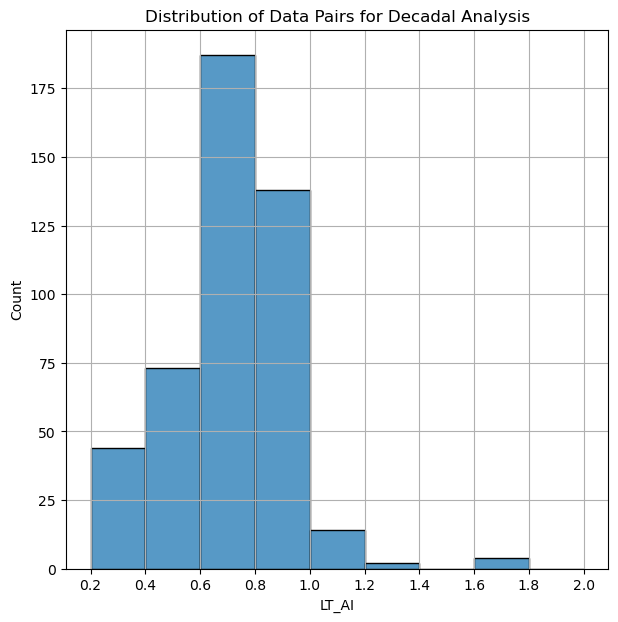

In [18]:
aridity_table1 = combo.set_index('system_index').sort_values('LT_AI')
aridity_table1['AI_group_narrow'] = pd.cut(aridity_table1['LT_AI'], AI_levels, labels=[f'{float(AI_levels[0])}-{float(AI_levels[1])}',
                                                                                     f'{float(AI_levels[1])}-{float(AI_levels[2])}',
                                                                                     f'{float(AI_levels[2])}-{float(AI_levels[3])}',
                                                                                     f'{float(AI_levels[3])}-{float(AI_levels[4])}',
                                                                                     f'{float(AI_levels[4])}-{float(AI_levels[5])}',
                                                                                     f'{float(AI_levels[5])}-{float(AI_levels[6])}',
                                                                                     f'{float(AI_levels[6])}-{float(AI_levels[7])}',
                                                                                     f'{float(AI_levels[7])}-{float(AI_levels[8])}',
                                                                                     f'{float(AI_levels[8])}-{float(AI_levels[9])}',], ordered=True)
grouped1 = aridity_table1.groupby('AI_group_narrow')

dist = []

for group, indices in grouped1.indices.items():
    
    print(f"Group: {group}, indice: {len(indices)}")
    dist.append(len(indices))

colors5 = ['#009B77', '#6CC24A','#FFB81C', '#EC6842', '#A50034']

#222222
fig = plt.figure(figsize=(7, 7))
sns.histplot(aridity_table1.LT_AI, bins=AI_levels)
plt.xticks(AI_levels)
plt.grid()
plt.title('Distribution of Data Pairs for Decadal Analysis');

In [19]:
def w_function(AI, w):
    EI = 1 + AI - (1 + (AI**w))**(1/w)
    return EI

In [20]:
plt.figure(99)
def many_w_curves():
    for i, (group, indices) in enumerate(grouped1):
        ls_EI = []
        ls_AI = []
        if i <=4:
            AI = np.linspace(AI_levels[i], AI_levels[i+1], 150)
            w = grouped1.mean()['omega'][i]
            EI_curve = w_function(AI, w)
            plt.plot(AI, EI_curve, linewidth=2, c=colors5[i], label=f'mean $\omega$ ={w:.3f}, AI: {group}')
            ls_EI.append(EI_curve)
            ls_AI.append(AI)
         
        else:
            break
    return [ls_EI, ls_AI]

#def fill_between_curves():

<Figure size 640x480 with 0 Axes>

Group: 0.2-0.4, indice: 22
Group: 0.4-0.6, indice: 37
Group: 0.6-0.8, indice: 97
Group: 0.8-1.0, indice: 69
Group: 1.0-1.2, indice: 7
Group: 1.2-1.4, indice: 1
Group: 1.4-1.6, indice: 0
Group: 1.6-1.8, indice: 2
Group: 1.8-2.0, indice: 0


C:\Users\creeb\AppData\Local\Temp\ipykernel_42804\1105719350.py:24: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(aridity_table.LT_AI, bins=AI_levels, palette=colors5)


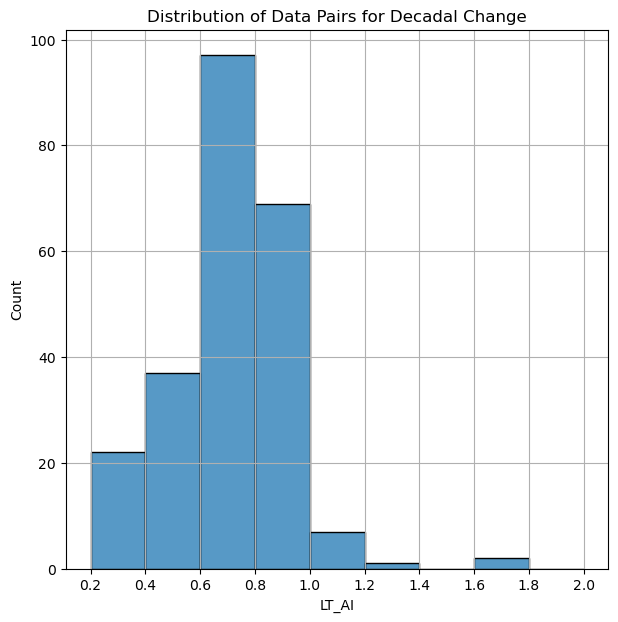

In [21]:
aridity_table = d_combo.set_index('system_index').sort_values('LT_AI')
aridity_table['AI_group_narrow'] = pd.cut(aridity_table['LT_AI'], AI_levels, labels=[f'{float(AI_levels[0])}-{float(AI_levels[1])}',
                                                                                     f'{float(AI_levels[1])}-{float(AI_levels[2])}',
                                                                                     f'{float(AI_levels[2])}-{float(AI_levels[3])}',
                                                                                     f'{float(AI_levels[3])}-{float(AI_levels[4])}',
                                                                                     f'{float(AI_levels[4])}-{float(AI_levels[5])}',
                                                                                     f'{float(AI_levels[5])}-{float(AI_levels[6])}',
                                                                                     f'{float(AI_levels[6])}-{float(AI_levels[7])}',
                                                                                     f'{float(AI_levels[7])}-{float(AI_levels[8])}',
                                                                                     f'{float(AI_levels[8])}-{float(AI_levels[9])}',], ordered=True)
grouped = aridity_table.groupby('AI_group_narrow')

dist = []

for group, indices in grouped.indices.items():
    
    print(f"Group: {group}, indice: {len(indices)}")
    dist.append(len(indices))

colors5 = ['#009B77', '#6CC24A','#FFB81C', '#EC6842', '#A50034']

#222222
fig = plt.figure(figsize=(7, 7))
sns.histplot(aridity_table.LT_AI, bins=AI_levels, palette=colors5)
plt.xticks(AI_levels)
plt.grid()
plt.title('Distribution of Data Pairs for Decadal Change');

In [22]:
combo

,catchment_name,B4,decade_ending,AI,EI,B7,ndbi,LT_EI,T,SI,...,ndmi,GREENNESS,WETNESS,Unnamed: 0,system_index,nbr,is_dur,LT_SR,B3,country_code
0,La Meuse Stenay,3505.870580,1995,0.723527,0.523830,1080.063217,-0.261393,0.491502,9.929822,0.130338,...,0.261393,1947.346107,-1101.055802,0,00000000000000000027,0.535894,4.209709,136.127009,760.450265,FR
1,La Vence la Francheville,3854.445260,1995,0.538129,0.409847,1059.051313,-0.279797,0.454026,9.312353,0.222241,...,0.279797,2283.432161,-1135.365148,1,0000000000000000001c,0.570896,4.320080,185.448285,669.720762,FR
2,La Bar Cheveuges,3689.468405,1995,0.600242,0.580658,1021.925823,-0.281666,0.584906,9.625349,0.190065,...,0.281666,2146.471886,-1070.187065,2,00000000000000000023,0.571166,4.293069,267.844657,689.500991,FR
3,Le Loison Han-lÃ©s-Juvigny,3548.118212,1995,0.638256,0.617702,1013.352084,-0.273264,0.606348,9.875898,0.181241,...,0.273264,2059.632583,-1075.027378,3,00000000000000000026,0.561081,4.365462,259.431829,670.659755,FR
4,La Meuse Saint-Mihiel,3645.584904,1995,0.745344,0.515176,1068.602832,-0.266628,0.537656,9.950750,0.125189,...,0.266628,2109.174757,-1129.484224,4,00000000000000000028,0.549572,4.304854,161.677726,698.729876,FR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461,3498500,3720.422102,2009,0.652670,0.610182,758.044025,-0.365442,0.590612,12.701172,0.218926,...,0.365442,2361.124447,-773.772549,229,000000000000000000f8,0.666455,3.723684,234.503356,469.320062,USA
462,6814000,3064.483575,2009,1.097098,0.870416,1299.125956,-0.120528,0.818152,11.421583,0.405217,...,0.120528,1637.531815,-1570.136446,230,00000000000000000179,0.404926,5.957845,311.800764,682.384961,USA
463,6921070,3447.254681,2009,0.836939,0.753206,1127.520982,-0.199551,0.688914,13.515433,0.246029,...,0.199551,2010.817466,-1362.424560,231,0000000000000000018b,0.506990,5.399113,267.042743,617.005689,USA
464,8086290,2617.010094,2009,1.549649,0.956205,1768.761404,0.031569,0.947938,17.914717,0.356316,...,-0.031569,899.262092,-2013.851057,232,000000000000000001c5,0.199563,8.856678,459.384967,1112.382887,USA


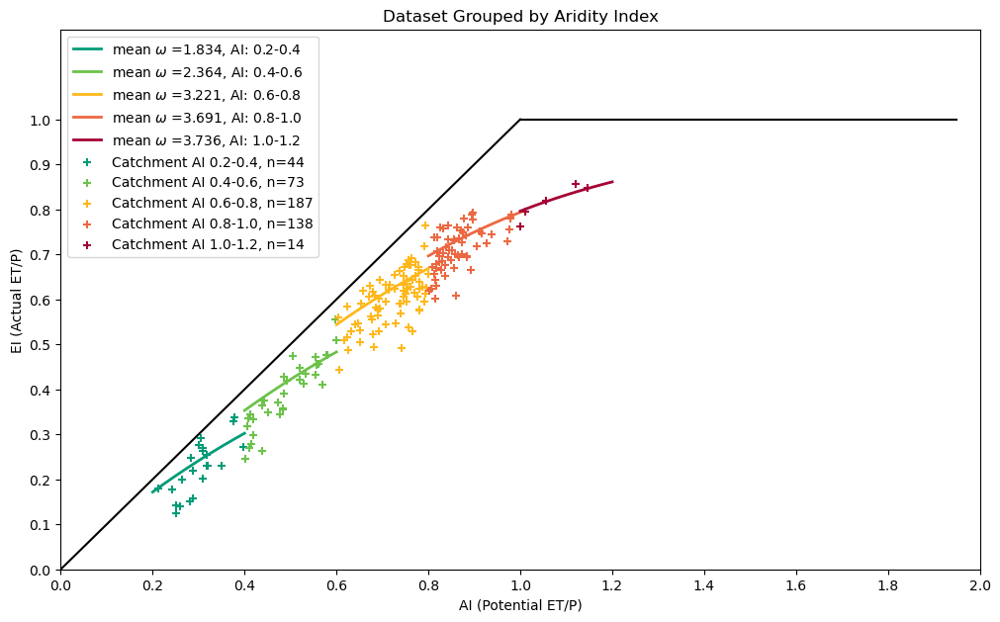

In [23]:
from matplotlib.colors import ListedColormap
from itertools  import chain

colors5 = ['#009B77', '#6CC24A','#FFB81C', '#EC6842', '#A50034']
colors9 = ['#FFFFFF','#009B77', '#6CC24A','#FFB81C', '#EC6842', '#A50034', '#222222', '#222222', '#222222']

budyko_curve_x = np.arange(1, 2, 0.05)
energy_limit_x = np.arange(0, 1.0001, 0.05)
x = np.arange(0, 1.0001, 0.05)
water_limit_y = 1 + budyko_curve_x*0
energy_limit_y = energy_limit_x
y = 1 + x*0

levels = [0, 0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2]

fig, ax = plt.subplots(1, constrained_layout=True, figsize=(10,6.18))

plt.ylabel("EI (Actual ET/P)")
plt.xlabel("AI (Potential ET/P)")

plt.xlim(0,2)
plt.ylim(0, 1.2)

plt.plot(energy_limit_x, energy_limit_y, c='k')
plt.plot(budyko_curve_x, water_limit_y,c='k')
plt.plot()

plt.yticks([0,0.1,0.2,0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plt.xticks([0,0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0]);

ls_EI, ls_AI = many_w_curves()

combo = combo.drop_duplicates(subset='system_index', keep='first')

for i in range(len(colors5)):
    mask = (combo['LT_AI'] >= AI_levels[i]) & (combo['LT_AI'] <= AI_levels[i+1])
    masked = combo[mask]
    scatter1 = ax.scatter(masked.LT_AI, masked.LT_EI, c = colors5[i], label=f'Catchment AI {list(grouped1.groups.keys())[i]}, n={len(list(grouped1.groups.values())[i])}', marker='+')

#cbar.set_ticks(AI_levels)
#cbar.set_ticklabels(colors9)

plt.title('Dataset Grouped by Aridity Index')

plt.legend()



In [24]:
ls_EI

[]

In [25]:
import pandas as pd

# Create a sample dataframe
df = pd.DataFrame({'A': [1, 2, 3, 4, 5],
                   'B': [10, 20, 30, 40, 50]})

# Specify the lower and upper levels for the indexing
lower_level = 2
upper_level = 4

# Create a boolean mask that selects rows where the value of 'A' is between the lower and upper levels
mask = (df['A'] >= lower_level) & (df['A'] <= upper_level)

# Use the boolean mask to index the dataframe
result = df[mask]

print(result)

   A   B
1  2  20
2  3  30
3  4  40


NameError: name 'indice' is not defined

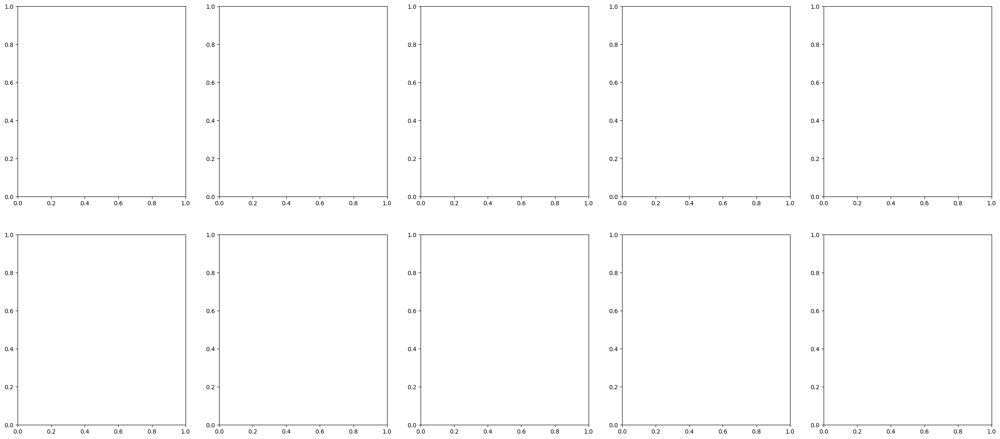

In [26]:
fig, ax = plt.subplots(2, 5, figsize=(30, 13))

n = []

index = np.arange(0, 6)


for i, (group, data) in enumerate(grouped):
    #if group is not None:
    #    print(data)
    #    break
    
    lim = np.max(abs(aridity_table.iloc[int(indice[0]):int(indice[-1])].loc[:, 'd_EI']))
    
    
    if len(data) >0 and lim <1 and i <5:  
        n=0
        
        x1 = data.d_EI
        #x1.plot.hist(ax=ax[n,i], alpha=0.5, label=group, color='lime')#, sharey=True)
        sns.histplot(y=x1, ax=ax[0,i], color = colors5[i], orientation='horizontal')
        #x = aridity_table.iloc[int(indice[0]):int(indice[-1])].loc[:, 'd_EI']
        
        mu = np.mean(x1)
        
        p10 = np.percentile(x1, 10)
        
        p90 = np.percentile(x1, 90)
        
        #x.plot.hist(alpha=0.5)#, label=f'{group}, n= {len(indice)}', edgecolor='black', linewidth=1.2, ax=ax1)
        
        ax[0,i].set_ylabel(f'$\Delta$ EI')
        ax[0,i].set_title(f'AI {group} \n (n={len(data)})')
        #ax.axvline(np.mean(aridity_table.iloc[int(indice[0]):int(indice[-1])].loc[:, 'LT_EI']))
        #plt.grid(visible=True, alpha=0.5)
        ax[0,i].axhline(mu, c='r', label=f'$\mu$: {mu:.3f}')
        ax[0,i].axhline(p10, c='r', ls='--', label=f'$p0.1$: {p10:.3f}')
        ax[0,i].axhline(p90, c='r', ls='--', label=f'$p0.9$: {p90:.3f}')
        ax[0,i].set_ylim(-lim*3, lim*3)
        ax[0,i].set_xlim(0, 25)
        ax[0,i].grid()
        ax[0,i].legend(loc='upper left')
        
    
    lim = np.max(abs(aridity_table.iloc[int(indice[0]):int(indice[-1])].loc[:, 'd_EI']))
    
    if len(data) >0 and lim <1 and i <5:  
        n=2
        #ax[1,i].add_subplot(sharey=True)
        x1 = data.d_AI
        #x1.plot.hist(ax=ax[n,i], alpha=0.5, label=group)#, sharey=True)
        sns.histplot(x=x1, ax=ax[1, i], color = colors5[i])
        #x = aridity_table.iloc[int(indice[0]):int(indice[-1])].loc[:, 'd_EI']
        
        mu = np.mean(x1)
        
        p10 = np.percentile(x1, 10)
        
        p90 = np.percentile(x1, 90)
        
        ax[1,i].set_xlabel(f'$\Delta$ AI')
        #ax[n,i].set_title(f'EI {group}')
        #ax.axvline(np.mean(aridity_table.iloc[int(indice[0]):int(indice[-1])].loc[:, 'LT_EI']))
        #plt.grid(visible=True, alpha=0.5)
        #ax[1,i].set_title(f'AI {group} \n (n={len(data)})')
        ax[1,i].axvline(mu, c='r', label=f'$\mu$: {mu:.3f}')
        ax[1,i].axvline(p10, c='r', ls='--', label=f'$p0.1$: {p10:.3f}')
        ax[1,i].axvline(p90, c='r', ls='--', label=f'$p0.9$: {p90:.3f}')
        ax[1,i].set_xlim(-lim*3, lim*3)
        ax[1,i].set_ylim(0, 19)
        ax[1,i].grid()
        ax[1,i].legend(loc='upper left')
    
    
    
    gp +=1
        
    


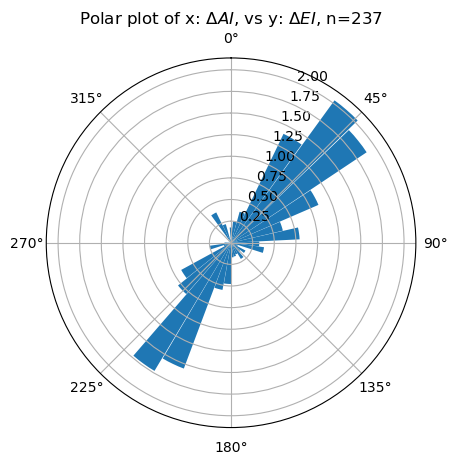

In [219]:
df = d_combo

# Get the angle and magnitude of each data point
angles = np.arctan2(df['d_EI'], df['d_AI'])
magnitudes = np.sqrt(df['d_AI']**2 + df['d_EI']**2)

# Create bins for the angles
bins = np.linspace(-np.pi, np.pi, num=36)

# Create a histogram of the angles
hist, _ = np.histogram(angles, bins=bins, weights=magnitudes)

# Plot the rose diagram
ax = plt.subplot(projection='polar')
ax.bar(bins[:-1], hist, width=2*np.pi/36, align='edge', bottom=0)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
ax.set_title(f"Polar plot of x: $\Delta AI$, vs y: $\Delta EI$, n={len(d_combo)}")
plt.show()

## Plotting polar distributions of movement within the budyko framework

magnitude = v = √((x2 – x1)^2 + (y2 – y1)^2)

direction and magnitude of movement within the framework

index [1 2 3 4 5]
[0.03060333 0.         0.01368946 0.15812278 0.01586114 0.
 0.         0.10572649 0.07564751 0.         0.0103939  0.01300978
 0.         0.01755858 0.00800247 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.02058919 0.03100826 0.00814686 0.         0.         0.07493858
 0.         0.         0.02384649 0.         0.        ]
[0.         0.         0.06635177 0.29472811 0.19727406 0.01958788
 0.01215064 0.09008309 0.         0.00836892 0.         0.
 0.         0.         0.11994675 0.         0.03908091 0.
 0.14370861 0.0154171  0.01475135 0.20043705 0.19899177 0.
 0.23157271 0.17448064 0.08919499 0.         0.         0.
 0.         0.00444206 0.01202198 0.03887508 0.        ]
[0.11093523 0.27559882 0.46159389 0.6001002  0.51684109 0.49136259
 0.07399387 0.05474179 0.         0.         0.         0.
 0.         0.         0.26227286 0.22341057 0.         0.17672029
 0.10428005 0.03546643 0.52430876 1.03364028 0.93999682 0.183

IndexError: index 5 is out of bounds for axis 0 with size 5

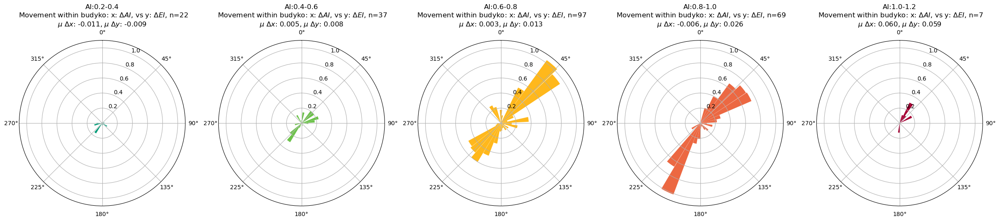

In [220]:

fig, ax = plt.subplots(1, 5, figsize=(30, 7.5))
n=0
index = np.arange(1, 6)
print('index',index)

for i, (group, df) in enumerate(grouped):
    if n <=5:
    
        y= df['d_EI']
        x=df['d_AI']

        mu_x = np.mean(x)
        mu_y = np.mean(y)

        # Get the angle and magnitude of each data point
        angles = np.arctan2(y,x)
        magnitudes = np.sqrt(x**2 + y**2)

        # Create bins for the angles
        bins = np.linspace(-np.pi, np.pi, num=36)

        # Create a histogram of the angles
        hist, _ = np.histogram(angles, bins=bins, weights=magnitudes)
        
        print(hist)
        
        # Plot the rose diagram
        ax = plt.subplot(1,5,index[n], projection='polar')
        ax.bar(bins[:-1], hist, width=2*np.pi/36, align='edge', bottom=0, color=colors5[n])
        ax.set_ylim(0, 1.1)
        ax.set_theta_zero_location("N")
        ax.set_theta_direction(-1)
        #ax.suptitle(f'AI group: {group}')
        ax.set_title(f"AI:{group}\n Movement within budyko: x: $\Delta AI$, vs y: $\Delta EI$, n={len(df)}\n$\mu$ $\Delta x$: {mu_x:.3f}, $\mu$ $\Delta y$: {mu_y:.3f}")
        n+=1
    else:
        break

What can we say about SR vs Tendencies in EI per AI

In [ ]:
#ranking = plot_descending_P(SR_indices, combo, sort_p, prs_r, SR_exclude, delta=False, plot=True, savefig=True, color_by='LT_AI', levels = AI_levels)


for i, (group, data) in enumerate(grouped):
    print(group)
    df = data
    display(df.corr())

# Corine Land Classes




In [ ]:
meuse_sysind = meuse.system_index.to_list()
classes = pd.read_excel('meuse/CORINE/land_cover_classes.xlsx')

periods = [1990, 2000, 2006, 2012, 2018]

len(meuse_sysind)*len(periods)



In [ ]:
df = pd.read_excel('meuse/CORINE/lc_0000000000000000001c_1990.xlsx')
df

In [ ]:
def meuse_class_table(classes, periods, sys_ind):
    '''
    For each land class table append the value to a combined table 
    '''
    combined_classes = pd.DataFrame(columns=classes.Value.astype(str))#, classes.Description, classes.loc[:,'Color Value']])#.insert(1, 'system_index', meuse_sysind[:])
    combined_classes.insert(0, 'period', np.nan, True)
    combined_classes.insert(0, 'system_index', 'a', True)
    combined_classes.set_index('system_index')
   
    #combined_classes.rename(columns={'Value':'system_index'})
    combined_classes.index.name = None
    

    row = 1

    for i, year in enumerate(periods):

        for j,  sys in enumerate(sys_ind[:]):
            
            filepath = f'meuse/CORINE/lc_{sys}_{year}.xlsx'
            

            df = pd.read_excel(filepath, converters={'system_index':str}, index_col='system_index')
            
            
            
            combined_classes.loc[row, 'period'] = int(year)
            combined_classes.loc[row, 'system_index'] = str(sys)
            combined_classes.set_index('system_index')
            
            df_set = list(df.keys()[:])
            cc_set = set(combined_classes.keys()[-44:])
            intersection = list(cc_set.intersection(df_set))
            
            l = df.index.values[0]
            
            
            
            for k in df_set:
                #print(df.loc[l, k])
                combined_classes.loc[row, k] = float(df.loc[l, k])
            
            row +=1
    combined_classes['summed'] = combined_classes.iloc[2:-1].sum(axis=1)
            
    return combined_classes
            


In [ ]:
meuse_table = meuse_class_table(classes, periods, meuse_sysind)
meuse_table.summed = meuse_table.iloc[:, 2:-1].sum(axis=1)


In [ ]:
grouped = meuse_table.groupby('period')

dfs = []

for i, (group, data) in enumerate(grouped):
    
    summed = data.sum()
    to_pct = np.cumsum(summed[2:-1])[-1]
    
    dic = {'year' : group,
           'artificial': np.cumsum(summed[2:13])[-1],#/to_pct, 
           'agricultural' : np.cumsum(summed[14:24])[-1],#/to_pct,
           'for_s_natural' : np.cumsum(summed[24:36])[-1],#/to_pct,
           'wetland' : np.cumsum(summed[36:41])[-1],#/to_pct, 
           'waterbody' : np.cumsum(summed[41:-1])[-1],}#/to_pct}
    
    dfs.append(pd.DataFrame(dic, index=[0]))



In [ ]:
table_90 = meuse_table.iloc[:grouped[1990][-1]]
table_00 = meuse_table.iloc[grouped[2000][0]:grouped[2000][-1]]
table_06 = meuse_table.iloc[grouped[2006][0]:grouped[2006][-1]]
table_12 = meuse_table.iloc[grouped[2012][0]:grouped[2012][-1]]
table_18 = meuse_table.iloc[grouped[2018][0]:grouped[2018][-1]]

display(table_90)

artificial = [111, 142]
agricultural = [211, 244]
for_s_natural = [311, 335]
wetland = [411, 423]
waterbodies = [511, 523]

table_list = [table_90,table_00, table_06, table_12, table_18]

cols = ['year','artificial','agricultural','for_s_natural','wetland','waterbody']

full = pd.DataFrame(columns=cols)

fig, ax = plt.subplots(1, 5, figsize=(30, 5))
yr =[]
art = []
ag = []
fors = []
wet = []
wat = []

for i, table in enumerate(table_list):
    
    year = list(grouped)[i]
    display(summed_table)
    summed_table = table.sum()
    to_pct = summed_table.summed
    #display(summed_table[41:])
    
    
    dic = {'year' : year,
           'artificial': summed_table[2:13].sum()/to_pct, 
           'agricultural' : summed_table[14:24].sum()/to_pct,
           'for_s_natural' : summed_table[24:36].sum()/to_pct,
           'wetland' : summed_table[36:41].sum()/to_pct, 
           'waterbody' : summed_table[41:-1].sum()/to_pct}
    
    cat = pd.DataFrame(dic, index=[0])
    
    yr.append(cat.year)
    art.append(cat.artificial)
    
    
    cat.loc[0, 'artificial':'waterbody'].plot(kind='bar', ax=ax[i], title=f'CORINE mean percentage $/km^2$, {year}')
    
    
    

full

In [ ]:
meuse_table.iloc[0, :]